In [1]:
import speech_recognition as sr
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import os

D:\Anaconda\lib\site-packages\resampy\interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 10005. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)


In [2]:
folder = 'audio_samples'

In [3]:
def show_waveplot(audio_path):
    x , sr = librosa.load(os.path.join(folder,audio_path))
    plt.figure(figsize=(20, 6))
    librosa.display.waveshow(x, sr=sr)

def show_spectrogram(audio_path):
    x , sr = librosa.load(os.path.join(folder,audio_path))
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(20,6))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()

def recognition(audio):
    sample_audio = sr.AudioFile(os.path.join(folder,audio))
    with sample_audio as source:
        audio = r.record(source)
    return r.recognize_google(audio)

In [4]:
r = sr.Recognizer()

### Hindi Recording
- In most of the recordings my name is not being detected properly, probably due to the unfamiliar way I pronounce it in addition to the background noise
- The speech recognizer is able to identify the spellings of the hindi words that we write using english alphabets almost correctly
- It is also doing a decent job in identifying the proper nouns in the sentences (e.g. Mumbai)
- It is able to detect the english words included in the middle of the hindi language
- The spectrograms are an indicator of how much noise can be present in a speech produced within a human environment and how much background noise can superpose the human speech
- The recognizer is also able to identify the number 25 which is said in hindi

In [5]:
ipd.Audio(os.path.join(folder,'Hindi Recording.wav'))

In [6]:
recognition("Hindi Recording.wav")

'Mera Naam Ka Rashi Mein M tech in artificial intelligence kar raha hun aur mein Mumbai mein'

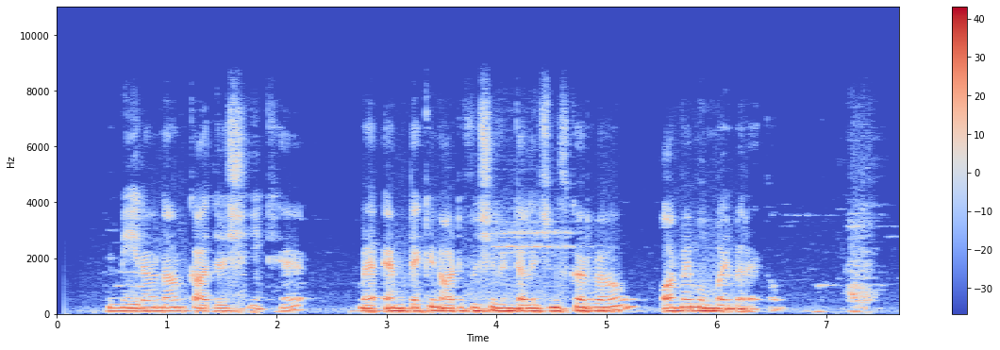

In [7]:
show_spectrogram("Hindi Recording.wav")

In [8]:
ipd.Audio(os.path.join(folder,'Hindi Recording 2.wav'))

In [9]:
recognition("Hindi Recording 2.wav")

'mera naam Kajal Sheikh hai aur mein 25 Sal Ka'

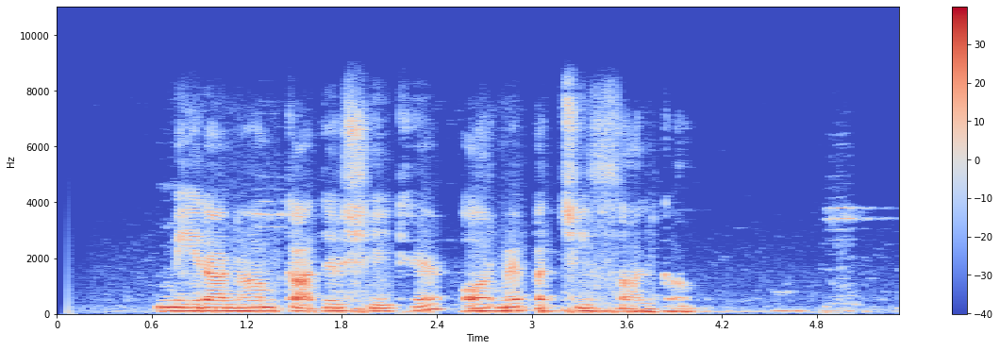

In [10]:
show_spectrogram("Hindi Recording 2.wav")

In [11]:
ipd.Audio(os.path.join(folder,'Hindi Recording 3.wav'))

In [12]:
recognition("Hindi Recording 3.wav")

'Mera Gala kharab hai technician mein problem ho sakta hai'

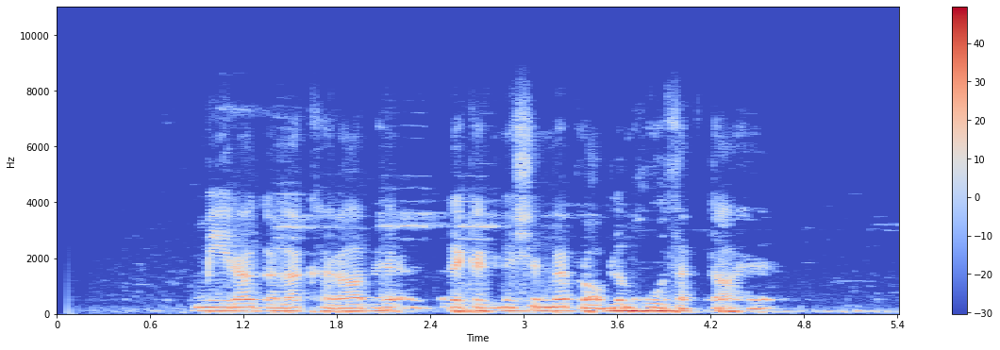

In [13]:
show_spectrogram("Hindi Recording 3.wav")

### English Recording
- The recognizer is able to semantically understand the english words even in their shortened forms e.g. tech and that M and tech are said separately. 
- Although incorrectly recognized the the word that is misinterpretted as eleven is converted to the number 11
- Although incorrectly recognized it can predict the possible words that may have been said which are closer to the previous word e.g. PM, elected by (possibly due to close semantic relationship of both the word in the form of word vector embeddings)
- The only limitation is that even though the speech indicates an ending of a sentence the recogizer is not able to identify that

In [14]:
ipd.Audio(os.path.join(folder,'English Recording.wav'))

In [15]:
recognition("English Recording.wav")

'my name is Shaikh I am currently pursuing M tech in artificial intelligence and 11 Mumbai'

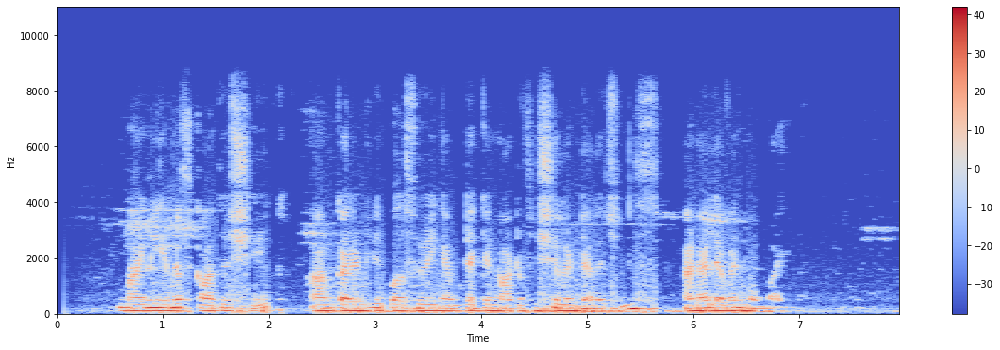

In [16]:
show_spectrogram("English Recording.wav")

In [17]:
ipd.Audio(os.path.join(folder,'English Recording 2.wav'))

In [18]:
recognition("English Recording 2.wav")

'I am a Manchester United fan it is very difficult to PM is elected by'

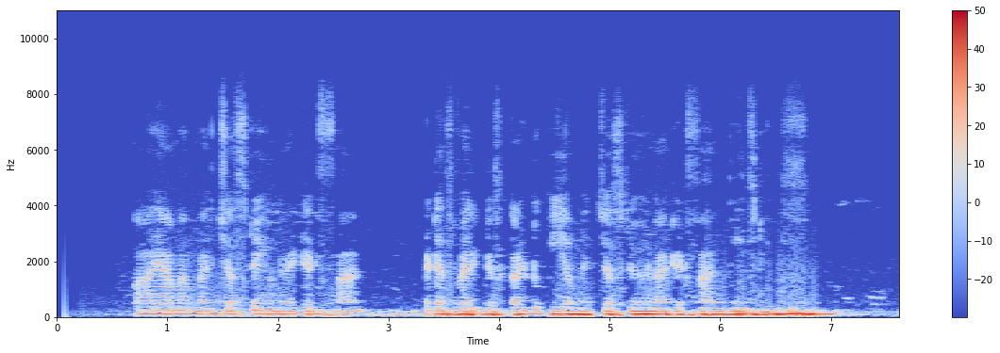

In [19]:
show_spectrogram("English Recording 2.wav")

In [20]:
ipd.Audio(os.path.join(folder,'English Recording 3.wav'))

In [21]:
recognition("English Recording 3.wav")

'my name is Kajal she and I am 25 years'

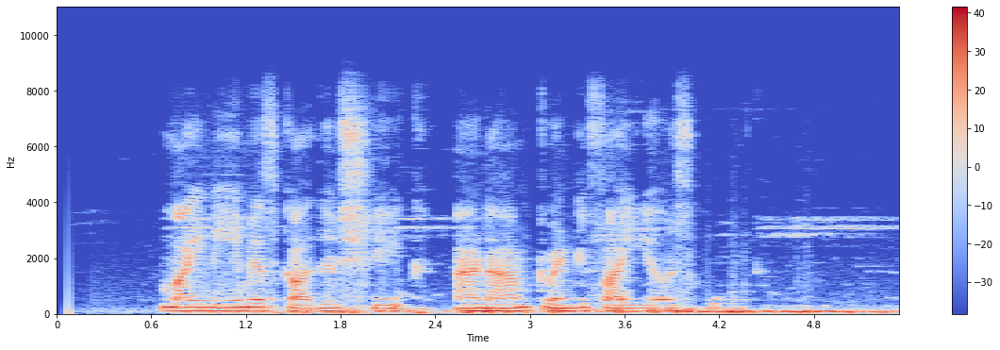

In [22]:
show_spectrogram("English Recording 3.wav")